<a href="https://colab.research.google.com/github/rnrrmr/yolo/blob/main/Train_YOLONAS_Custom_Dataset_PPE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**🚨 Before Running the Script Please Make Sure you have selected the Run Time as GPU**

#**Step 01: Installing the Packages**

In [ ]:
%%capture
!pip install super-gradients==3.1.0
!pip install imutils
!pip install roboflow
!pip install pytube --upgrade

In [ ]:
%%capture
!pip install super_gradients==3.1.0

In [ ]:
!apt install python3-super_gradients

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
E: Unable to locate package python3-super_gradients


In [ ]:
!pip install super_gradients
# 이거하고 런타임 안돌리고 그냥 하니까 됨
# 근데 에러떠러 런타임 돌리고 다시함

In [ ]:
%%capture
!pip install --upgrade pyparsing
!pip install --upgrade sphinx roboflow

#**🚨 Restart the Run Time**

#**Step 02: Importing all the required libraries**

In [ ]:
!pip show super_gradients

In [ ]:
from super_gradients.training import Trainer
from super_gradients.training import dataloaders
from super_gradients.training.dataloaders.dataloaders import coco_detection_yolo_format_train, coco_detection_yolo_format_val

In [ ]:
from IPython.display import clear_output

In [ ]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback



In [ ]:
from super_gradients.training import models


#**Step 03: Setting the checkpoint directory and experiment name | Instantiated the trainer**

In [ ]:
CHECKPOINT_DIR = 'checkpoints2'
trainer = Trainer(experiment_name='ppe_yolonas_run2', ckpt_root_dir=CHECKPOINT_DIR)

#**Step 04: Exporting the Dataset from Roboflow into the Google Colab Notebook**

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="IuYv6KOKs5p62rFSLvGa")
project = rf.workspace("objet-detect-yolov5").project("eep_detection-u9bbd")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to EEP_Detection-1 in yolov5pytorch:: 100%|██████████| 6482/6482 [00:01<00:00, 5176.99it/s]


#**Step 05: Load your dataset parameters into a dictionary**

You'll need to load your dataset parameters into a dictionary, specifically defining:

- path to the parent directory where your data lives
- the child directory names for training, validation, and test (if you have testing set) images and labels
- class names

In [ ]:
dataset_params = {
    'data_dir':'/content/EEP_Detection-1',
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': ['Protective Helmet', 'Shield', 'Jacket', 'Dust Mask', 'Eye Wear', 'Glove', 'Protective Boots']
}


#**Step 06: Pass the values for `dataset_params` into the `dataset_params` argument as shown below.**

In [ ]:
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size':16,
        'num_workers':2
    }
)

clear_output()

Caching annotations: 100%|██████████| 324/324 [00:00<00:00, 2931.74it/s]


#**Step 07: Inspect the Dataset Defined Earlier**

In [ ]:
train_data.dataset.transforms

[DetectionMosaic('additional_samples_count': 3, 'non_empty_targets': False, 'prob': 1.0, 'input_dim': (640, 640), 'enable_mosaic': True, 'border_value': 114),
 DetectionRandomAffine('additional_samples_count': 0, 'non_empty_targets': False, 'degrees': 10.0, 'translate': 0.1, 'scale': [0.1, 2], 'shear': 2.0, 'target_size': (640, 640), 'enable': True, 'filter_box_candidates': True, 'wh_thr': 2, 'ar_thr': 20, 'area_thr': 0.1, 'border_value': 114),
 DetectionMixup('additional_samples_count': 1, 'non_empty_targets': True, 'input_dim': (640, 640), 'mixup_scale': [0.5, 1.5], 'prob': 1.0, 'enable_mixup': True, 'flip_prob': 0.5, 'border_value': 114),
 DetectionHSV('additional_samples_count': 0, 'non_empty_targets': False, 'prob': 1.0, 'hgain': 5, 'sgain': 30, 'vgain': 30, 'bgr_channels': (0, 1, 2), '_additional_channels_warned': False),
 DetectionHorizontalFlip('additional_samples_count': 0, 'non_empty_targets': False, 'prob': 0.5),
 DetectionPaddedRescale('additional_samples_count': 0, 'non_em

In [ ]:
train_data.dataset.dataset_params['transforms'][1]

{'DetectionRandomAffine': {'degrees': 10.0, 'translate': 0.1, 'scales': [0.1, 2], 'shear': 2.0, 'target_size': [640, 640], 'filter_box_candidates': True, 'wh_thr': 2, 'area_thr': 0.1, 'ar_thr': 20}}

In [ ]:
train_data.dataset.dataset_params['transforms'][1]['DetectionRandomAffine']['degrees'] = 10.42

#**Step 08: Plot a batch of training data with their augmentations applied to see what they look like**

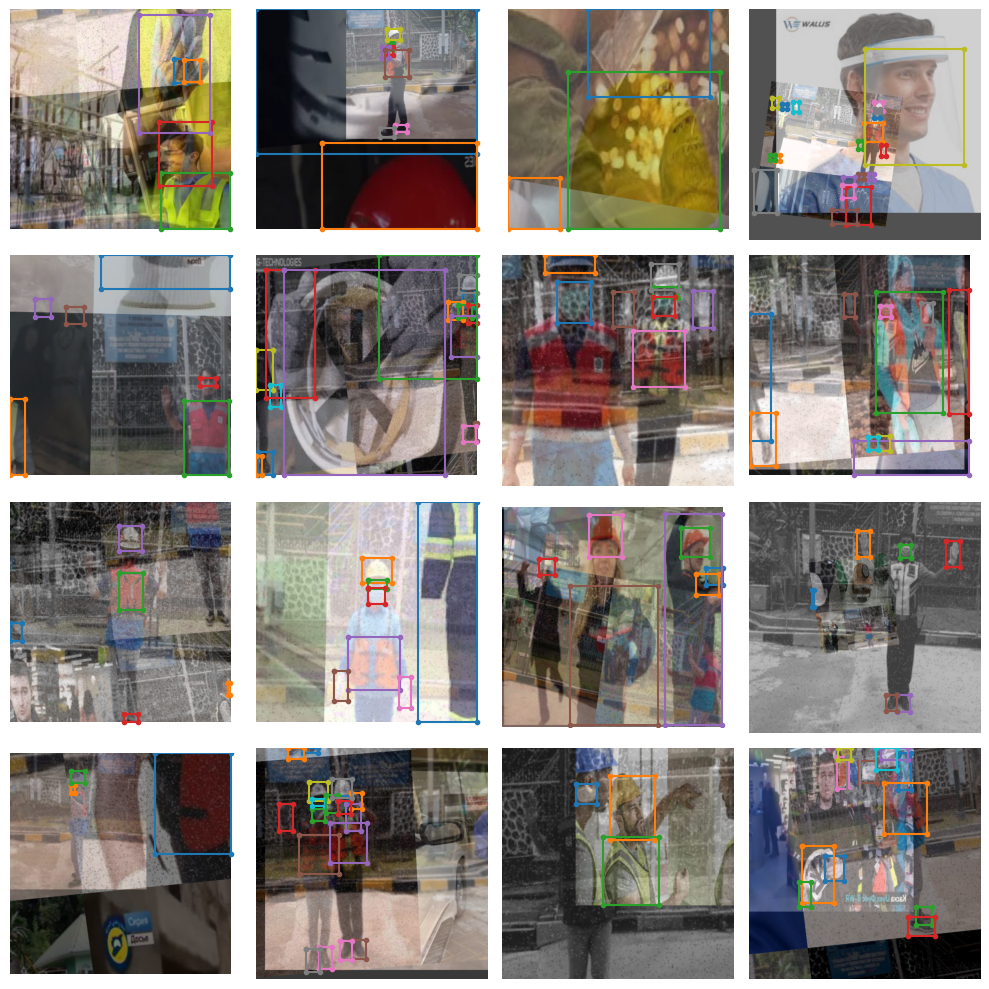

In [ ]:
train_data.dataset.plot()

#**Step 09: Instantiating the model**


You saw how to instantiate the model for inference earlier.

Below is how to instantiate the model for finetuning. Note you need to add the `num_classes` argument here.

Note, for this tutorial we are using `yolo_nas_s`, but SuperGradients has two other flavors of YOLONAS available to you: `yolo_nas_m` and `yolo_nas_l`.

In [ ]:
model = models.get('yolo_nas_s',
                   num_classes=len(dataset_params['classes']),
                   pretrained_weights="coco"
                   )

[2023-08-03 06:53:33] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_s_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_s_coco.pth
100%|██████████| 73.1M/73.1M [00:04<00:00, 17.1MB/s]


#**Step 10: 📊 Define metrics and training parameters**


We need to define the training parameters for your training run.

Full details about the training parameters can be found [here](https://github.com/Deci-AI/super-gradients/blob/master/src/super_gradients/recipes/training_hyperparams/default_train_params.yaml).


### 🚨 There are a few **mandatory** arguments that we must define for training params 🚨

- `max_epochs` - Max number of training epochs

- `loss` - the loss function you want to use

- `optimizer` - Optimizer you will be using

- `train_metrics_list` - Metrics to log during training

- `valid_metrics_list` - Metrics to log during training

- `metric_to_watch` - metric which the model checkpoint will be saved according to

We can choose from a variety of `optimizer`'s such as: Adam, AdamW, SGD, Lion, or RMSProps. If you choose to change the defualt parameters of these optimizrs you pass them into `optimizer_params`.


In [ ]:
train_params = {
    # ENABLING SILENT MODE
    'silent_mode': True,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    # ONLY TRAINING FOR 10 EPOCHS FOR THIS EXAMPLE NOTEBOOK
    "max_epochs": 10,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        # NOTE: num_classes needs to be defined here
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

#**Step 11: Download the Demo Videos**

In [ ]:
!gdown "https://drive.google.com/uc?id=1crFwrpMF1OlaJ0ZCZjBNRo9llLEVR8VQ&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1crFwrpMF1OlaJ0ZCZjBNRo9llLEVR8VQ&confirm=t
To: /content/demo.mp4
 40% 17.3M/42.9M [00:00<00:00, 46.5MB/s]

In [ ]:
!gdown "https://drive.google.com/uc?id=1cTIBNQ1R_7JAOURVv9cJ6P935ym_IkZ0&confirm=t"

100% 42.9M/42.9M [00:00<00:00, 64.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=1cTIBNQ1R_7JAOURVv9cJ6P935ym_IkZ0&confirm=t
To: /content/demo3.mp4
  0% 0.00/20.3M [00:00<?, ?B/s]

In [ ]:
!gdown "https://drive.google.com/uc?id=1256pNK0nQnEDT6FRLQAraTRkOY7BSprq&confirm=t"

100% 20.3M/20.3M [00:00<00:00, 42.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1256pNK0nQnEDT6FRLQAraTRkOY7BSprq&confirm=t
To: /content/demo4.mp4
 47% 7.86M/16.9M [00:00<00:00, 76.3MB/s]

In [ ]:
!gdown "https://drive.google.com/uc?id=15D71z_g8uxZfXSx2ya3sy4n2-eg53meH&confirm=t"


100% 16.9M/16.9M [00:00<00:00, 85.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=15D71z_g8uxZfXSx2ya3sy4n2-eg53meH&confirm=t
To: /content/demonew.mp4
  0% 0.00/5.39M [00:00<?, ?B/s]

In [ ]:
!gdown "https://drive.google.com/uc?id=1iYW9ZAsYAaHkWZhFVwQh_ch41TMt30-Q&confirm=t"

100% 5.39M/5.39M [00:00<00:00, 30.5MB/s]


#**Step 12: 🦾 Training the model**

You've covered a lot of ground so far:

✅ Instantiated the trainer

✅ Defined your dataset parameters and dataloaders

✅ Instantiated a model

✅ Set up your training parameters

### ⏳ Now, its time to train a model

Training a model using a SuperGradients is done using the `trainer`.

It's as easy as...

In [ ]:
trainer.train(model=model,
              training_params=train_params,
              train_loader=train_data,
              valid_loader=val_data)

The console stream is now moved to checkpoints2/ppe_yolonas_run2/console_Aug03_06_54_23.txt


[2023-08-03 06:54:23] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
[2023-08-03 06:54:26] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Dataset size:                 2264       (len(train_set))
    - Batch size per GPU:           16         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             16         (num_gpus * batch_size)
    - Effective Batch size:         16         (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         141        (len(train_loader))
    - Gradient updates per epoch:   141        (len(train_loader) / batch_accumulate)

[2023-08-03 06:57:25] INFO - base_sg_logger.py - Checkpoint saved in checkpoints2/ppe_yolonas_run2/ckpt_best.pth
[2023-08-03 06:57:25] INFO - sg_trainer.py - Best checkpoint overriden: valida


분석 결과

1. 학습 진행 상황:

    - 학습이 진행 중이며, 에폭당 141 번의 반복이 수행되고 있음.
    - 현재 학습 데이터셋 크기는 2264이며, 배치 크기는 16이고, GPU 1개를 사용하고 있음.
    - 그레이디언트 업데이트는 배치 누적 1번으로 수행되고 있음.
    - 효과적인 배치 크기는 16 (1 GPU * 16 배치 크기 * 1 배치 누적)

2. 학습 결과:

    - 학습 중 Best checkpoint가 여러 차례 갱신되고 있음.
    - 검증 데이터셋에 대한 mAP@0.50이 0.007에서 시작하여 계속해서 상승함.
    - 마지막으로 최고의 결과로 0.780의 mAP@0.50을 달성함.

3. 추가 테스트:

    - 학습이 완료된 모델에 대해 추가적인 테스트가 수행되고 있음.
    - 에폭 10에서 검증이 진행 중인 것으로 보임.



#**Step 13: 🏆 Get the best trained model**

In [ ]:
best_model = models.get('yolo_nas_s',
                        num_classes=len(dataset_params['classes']),
                        checkpoint_path="checkpoints2/ppe_yolonas_run2/ckpt_best.pth")

[2023-08-03 07:24:14] INFO - checkpoint_utils.py - Successfully loaded model weights from checkpoints2/ppe_yolonas_run2/ckpt_best.pth EMA checkpoint.


#**Step 14: 🧐 Evaluating the best trained model on the test set**

In [ ]:
trainer.test(model=best_model,
            test_loader=test_data,
            test_metrics_list=DetectionMetrics_050(score_thres=0.1,
                                                   top_k_predictions=300,
                                                   num_cls=len(dataset_params['classes']),
                                                   normalize_targets=True,
                                                   post_prediction_callback=PPYoloEPostPredictionCallback(score_threshold=0.01,
                                                                                                          nms_top_k=1000,
                                                                                                          max_predictions=300,
                                                                                                          nms_threshold=0.7)
                                                  ))

Testing:  95%|█████████▌| 20/21 [00:10<00:00,  2.30it/s]

{'PPYoloELoss/loss_cls': 0.7592687,
 'PPYoloELoss/loss_iou': 0.1623376,
 'PPYoloELoss/loss_dfl': 0.8824284,
 'PPYoloELoss/loss': 1.6063268,
 'Precision@0.50': 0.07303828001022339,
 'Recall@0.50': 0.9742293953895569,
 'mAP@0.50': 0.7968376874923706,
 'F1@0.50': 0.13197162747383118}

Testing: 100%|██████████| 21/21 [00:11<00:00,  1.88it/s]


🔼 분석

1. 테스트 결과:

    - 테스트 데이터셋에 대해 성능 측정 결과가 나타남.
    - Precision@0.50: 0.07303828001022339 (IoU 0.50에서의 정밀도)
    - Recall@0.50: 0.9742293953895569 (IoU 0.50에서의 재현율)
    - mAP@0.50: 0.7968376874923706 (IoU 0.50에서의 평균 정밀도)
    - F1@0.50: 0.13197162747383118 (IoU 0.50에서의 F1-score)

2. 성능 분석:

    - IoU 0.50에서의 평균 정밀도(mAP)가 약 0.797로 상당히 높은 수치를 기록함.
    - 하지만 Precision@0.50와 F1@0.50는 낮은 수치로 보입니다. 이는 IoU 0.50에서의 정밀도와 F1-score가 낮다는 의미입니다.
    - Recall@0.50이 매우 높은 값으로 나타남. IoU 0.50에서의 재현율이 높은 것을 확인할 수 있습니다.

3. 개선 방향:

    - 모델의 정밀도를 개선하는 것이 중요하며, F1-score도 함께 개선해야 합니다.
    - 정밀도를 향상시키기 위해 모델을 더 깊게 학습하거나, 하이퍼파라미터를 조정하여 최적의 설정을 찾아볼 수 있습니다.
    - 또한, IoU 임계값을 조정하거나 다른 평가 메트릭을 사용하여 결과를 검토할 수도 있습니다.

`Recall@0.50` (재현율 @ 0.50):
재현율(Recall)은 실제 양성 클래스 중에서 모델이 정확하게 감지한 양성 샘플의 비율을 나타냅니다. 여기서 '@0.50'은 IoU 임계값이 0.50일 때의 재현율을 의미


`mAP@0.50` (평균 정밀도 @ 0.50):
mAP는 Mean Average Precision의 약자로, 여러 임계값에서의 정밀도 값을 평균한 값입니다. 여기서 '@0.50'은 IoU 임계값이 0.50일 때의 평균 정밀도를 의미


`F1@0.50` (F1 점수 @ 0.50):
F1 점수는 정밀도와 재현율의 조화 평균으로 계산되는 평가 지표로, 모델의 정밀도와 재현율을 동시에 고려합니다. 여기서 '@0.50'은 IoU 임계값이 0.50일 때의 F1 점수를 의미

<br>

이 결과를 통해 모델이 일부 클래스에 대해서는 높은 재현율을 갖고 있지만, 정밀도와 F1 점수가 낮은 것을 알 수 있습니다. IoU 임계값이 0.50일 때의 평가 결과를 기준으로 한다면, 모델의 개선이 필요한 부분이 있을 수 있습니다.

IoU 임계값이 다른 값에 대해서도 평가 결과를 확인해보면, 모델의 성능에 대해 더 전체적인 정보를 얻을 수 있을 것입니다. 또한 다른 평가 지표들도 고려하여 모델의 성능을 평가하는 것이 중요합니다. 이러한 결과를 바탕으로 모델을 개선하거나 수정할 수 있습니다.

#**Step 15: 🔮 Predicting with the best model**



[2023-08-03 07:25:08] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


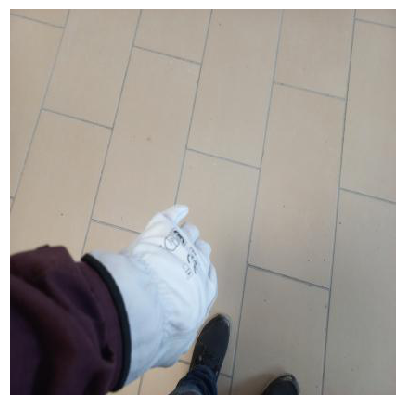

In [ ]:
img_url = '/content/EEP_Detection-1/valid/images/20220721_161927_jpg.rf.56b8fd236d16af66703544bae6fb6d14.jpg'
best_model.predict(img_url).show()

#**Step 16: Testing on Video 1**

In [ ]:
input_video_path = f"/content/demonew.mp4"
output_video_path = "detections.mp4"

In [ ]:
import torch
device = 'cuda' if torch.cuda.is_available() else "cpu"

In [ ]:
best_model.to(device).predict(input_video_path).save(output_video_path)

Predicting Video: 100%|██████████| 93/93 [00:08<00:00, 10.79it/s]


#**Display the Output Video**

In [ ]:
!rm '/content/result_compressed.mp4'

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/detections.mp4'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

#**Step 17: Testing on Video 2**

In [ ]:
input_video_path = f"/content/demonew2.mp4"
output_video_path = "detections.mp4"

In [ ]:
import torch
device = 'cuda' if torch.cuda.is_available() else "cpu"

In [ ]:
best_model.to(device).predict(input_video_path).save(output_video_path)

Predicting Video: 100%|██████████| 65/65 [00:09<00:00,  7.12it/s]


#**Display the Output Video**

In [ ]:
!rm '/content/result_compressed.mp4'

In [ ]:
import os

os.environ['LANG'] = 'en_US.UTF-8'
os.environ['LC_ALL'] = 'en_US.UTF-8'

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/detections.mp4'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)